## Part 3 : Final Model and deployment:

In [1]:
#Importing the required libraries for Analysis:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
from prophet import Prophet
from statsmodels.tools.eval_measures import rmse
from prophet.plot import plot_components_plotly,plot_plotly
import streamlit as st

In [2]:
#Importing dataset:
oil = pd.read_excel("Crude.xlsx",header=0,parse_dates=True)
#Renaming Closing Value to Price:
oil.rename(columns={'Closing Value':'Price'},inplace=True)

In [3]:
oil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9564 entries, 0 to 9563
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    9564 non-null   datetime64[ns]
 1   Price   9557 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 149.6 KB


### Resampling and Interpolation:

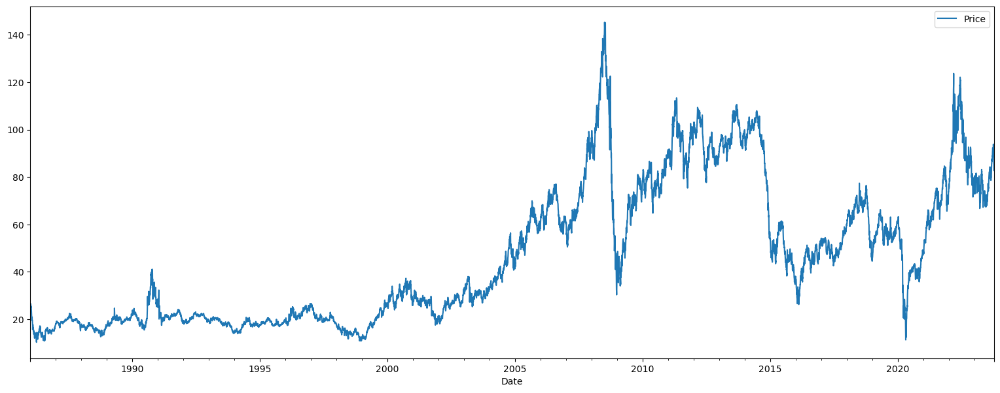

In [4]:
oil.set_index('Date',inplace=True,drop=True) # Resetting Index

oil = oil.resample('D').mean() # Resampling at Daily level

oil = oil.interpolate(method='linear') # Fillling the new null values with mean of previous and next values.
oil.plot(figsize = (19,7))
plt.show() 

### FB Prophet:

In [5]:
#Preparing dataset:
oil.reset_index(inplace=True)
oil.columns = ['ds','y']
oil.head()

,ds,y
0,1986-01-02,25.560000
1,1986-01-03,26.000000
2,1986-01-04,26.176667
3,1986-01-05,26.353333
4,1986-01-06,26.530000


In [6]:
#Splitting data into train and test:
train = oil.iloc[:len(oil)-365]
test = oil.iloc[len(oil)-365:]

In [7]:
#Creating model:
m = Prophet(interval_width=.95) #calling prohet class # 95% prediction interval
m.fit(train)

19:38:47 - cmdstanpy - INFO - Chain [1] start processing
19:38:54 - cmdstanpy - INFO - Chain [1] done processing


In [8]:
future = m.make_future_dataframe(periods = 365) #by default the period is set to DAY
forecast = m.predict(future)
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
13787,2023-10-02,79.598237,57.865215,104.203069,62.452944,96.473196,0.702330,0.702330,0.702330,-0.007518,-0.007518,-0.007518,0.709848,0.709848,0.709848,0.0,0.0,0.0,80.300567
13788,2023-10-03,79.610607,57.057699,104.839443,62.352044,96.537122,0.673343,0.673343,0.673343,-0.029911,-0.029911,-0.029911,0.703254,0.703254,0.703254,0.0,0.0,0.0,80.283950
13789,2023-10-04,79.622976,58.695267,106.201205,62.251859,96.600566,0.680198,0.680198,0.680198,-0.015002,-0.015002,-0.015002,0.695200,0.695200,0.695200,0.0,0.0,0.0,80.303175
13790,2023-10-05,79.635346,57.634564,102.581141,62.151675,96.663640,0.689691,0.689691,0.689691,0.004441,0.004441,0.004441,0.685250,0.685250,0.685250,0.0,0.0,0.0,80.325037
13791,2023-10-06,79.647716,58.961507,106.676234,62.051490,96.726714,0.698666,0.698666,0.698666,0.025691,0.025691,0.025691,0.672975,0.672975,0.672975,0.0,0.0,0.0,80.346382


In [9]:
predictions = forecast.iloc[-365:]['yhat']

In [10]:
print('RMSE : ',round(rmse(predictions,test.y),2))

RMSE :  7.15


#### Visualization using Built-In FB Prophet libraries:

In [11]:
plot_plotly(m,forecast)

In [12]:
plot_components_plotly(m,forecast)

##### Creating final model and pickling it:

In [13]:
m = Prophet()
m.fit(oil)

19:39:04 - cmdstanpy - INFO - Chain [1] start processing
19:39:09 - cmdstanpy - INFO - Chain [1] done processing


In [14]:
import pickle #pickle module
pickle_out = open("prophet.pkl",mode = "wb")
pickle.dump(m,pickle_out)
pickle_out.close()

In [15]:
%%writefile oil.py
 
import pickle
import streamlit as st
from prophet import Prophet
from prophet.plot import plot_plotly

# loading the trained model
pickle_in = open('prophet.pkl', 'rb') 
model = pickle.load(pickle_in)
 
@st.cache_data() #Decorator fn
  
# defining the function which will make the forecast:


def prediction(n_years):   
      # Making predictions 
    future = model.make_future_dataframe(periods = n_years*365)
    forecast = model.predict(future)
    data = forecast.iloc[n_years*(-365):]
    return data
      
  
# this is the main function in which we define our webpage  
def main():       
    # front end elements of the web page 
    html_temp = """ 
    <div style ="background-color:white;padding:13px"> 
    <h1 style ="color:black;text-align:center;">Crude Oil Price Forecast</h1> 
    </div> 
    """
      
    # display the front end aspect
    st.markdown(html_temp, unsafe_allow_html = True)
    
    #Input years:
    n_years = st.slider("Select the number of years of forecast: ",1,4)
      
    # When 'Forecast' is clicked, make the forecast:
    if st.button("Forecast"): 
        result = prediction(n_years)
        st.subheader('Forecast Data:')
        st.write(result[['ds','yhat']])
        st.subheader('Forecast Plot:')
        fig = plot_plotly(model,result)
        st.plotly_chart(fig)
        
if __name__=='__main__': 
    main()

Overwriting oil.py
